In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import rasterio as rio
from s2mosaic import mosaic

In [2]:
# logging.basicConfig(
#     level=logging.INFO, format="%(asctime)s - %(levelname)s - %(message)s"
# )

In [3]:
# Set up matplotlib for better plots
plt.rcParams["figure.figsize"] = (15, 10)
plt.rcParams["font.size"] = 12

# Create output directory for saved mosaics
output_dir = Path("visual_test_outputs")
output_dir.mkdir(exist_ok=True)

In [4]:
def plot_mosaic_rgb(array, title="Mosaic", percentile_stretch=True):
    """Plot RGB mosaic with optional percentile stretch"""
    if array.shape[0] == 3:  # RGB
        # Move bands to last dimension for matplotlib
        rgb = np.moveaxis(array, 0, -1)

        if percentile_stretch:
            # Apply 2-98 percentile stretch for better visualization
            for i in range(3):
                band = rgb[:, :, i]
                p2, p98 = np.percentile(band[band > 0], [2, 98])
                rgb[:, :, i] = np.clip((band - p2) / (p98 - p2) * 255, 0, 255)

        plt.figure(figsize=(12, 8))
        plt.imshow(rgb.astype(np.uint8))
        plt.title(title)
        plt.axis("off")
        plt.tight_layout()
        plt.show()
    else:
        print(f"Cannot plot RGB - array has {array.shape[0]} bands, need 3")


def plot_single_band(
    array, band_index=0, title="Single Band", cmap="viridis", vmin=0, vmax=6000
):
    """Plot a single band with colormap"""
    plt.figure(figsize=(10, 8))
    band_data = array[band_index]

    # Mask out zero values for better visualization
    masked_data = np.ma.masked_where(band_data == 0, band_data)

    im = plt.imshow(masked_data, cmap=cmap, vmin=vmin, vmax=vmax)
    plt.colorbar(im, shrink=0.6)
    plt.title(f"{title} - Band {band_index}")
    plt.axis("off")
    plt.tight_layout()
    plt.show()


def compare_mosaics(arrays, titles, band_index=0, vmin=0, vmax=6000):
    """Compare multiple mosaics side by side"""
    n_mosaics = len(arrays)
    fig, axes = plt.subplots(1, n_mosaics, figsize=(5 * n_mosaics, 5))

    if n_mosaics == 1:
        axes = [axes]

    for i, (array, title) in enumerate(zip(arrays, titles)):
        if array.shape[0] > band_index:
            band_data = array[band_index]
            masked_data = np.ma.masked_where(band_data == 0, band_data)

            im = axes[i].imshow(masked_data, cmap="viridis", vmin=vmin, vmax=vmax)
            axes[i].set_title(title)
            axes[i].axis("off")
            plt.colorbar(im, ax=axes[i], shrink=0.6)

    plt.tight_layout()
    plt.show()

Creating basic RGB mosaic...


Scenes: 0/4 | Mosaic currently contains 100.00% no data pixels

RGB Array shape: (3, 10980, 10980)
RGB Array dtype: int16
RGB Array range: 0 to 11752


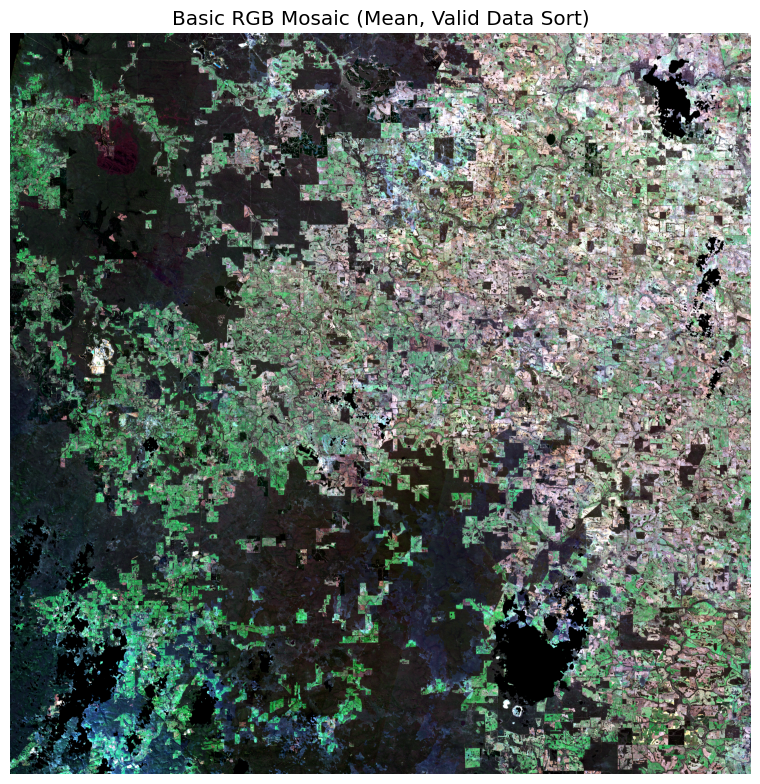

In [5]:
print("Creating basic RGB mosaic...")

# Create a standard RGB mosaic
rgb_array, rgb_profile = mosaic(
    "50HMH",
    2023,
    start_month=6,
    start_day=1,
    duration_days=14,
    debug_cache=True,
    required_bands=["B04", "B03", "B02"],  # Red, Green, Blue
    sort_method="valid_data",
    mosaic_method="mean",
)

print(f"RGB Array shape: {rgb_array.shape}")
print(f"RGB Array dtype: {rgb_array.dtype}")
print(f"RGB Array range: {rgb_array.min()} to {rgb_array.max()}")

# Plot the RGB mosaic
plot_mosaic_rgb(rgb_array, "Basic RGB Mosaic (Mean, Valid Data Sort)")

Creating visual band mosaic...


Scenes: 0/4 | Mosaic currently contains 100.00% no data pixels

Visual Array shape: (3, 10980, 10980)
Visual Array dtype: uint8
Visual Array range: 0 to 255


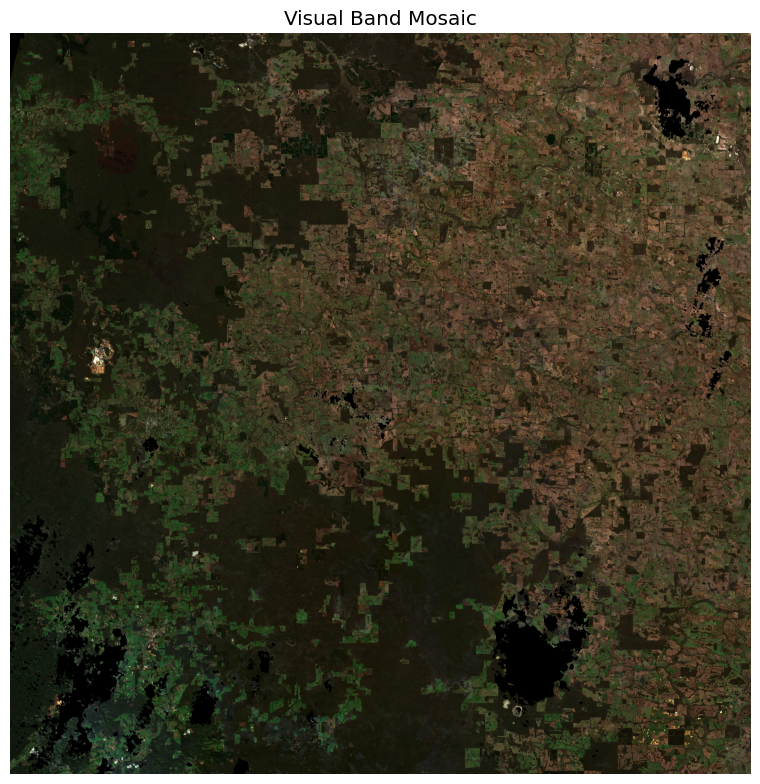

In [6]:
print("Creating visual band mosaic...")

# Create a visual band mosaic (this should be RGB in uint8)
visual_array, visual_profile = mosaic(
    "50HMH",
    2023,
    start_month=6,
    start_day=1,
    duration_days=14,
    debug_cache=True,
    required_bands=["visual"],
    sort_method="valid_data",
    mosaic_method="mean",
)

print(f"Visual Array shape: {visual_array.shape}")
print(f"Visual Array dtype: {visual_array.dtype}")
print(f"Visual Array range: {visual_array.min()} to {visual_array.max()}")

# Plot the visual mosaic
plot_mosaic_rgb(visual_array, "Visual Band Mosaic", percentile_stretch=False)

Comparing different sort methods...
Creating mosaic with sort method: valid_data


Scenes: 0/11 | Mosaic currently contains 100.00% no data pixels

Creating mosaic with sort method: oldest


Scenes: 0/11 | Mosaic currently contains 100.00% no data pixels

Creating mosaic with sort method: newest


Scenes: 0/11 | Mosaic currently contains 100.00% no data pixels

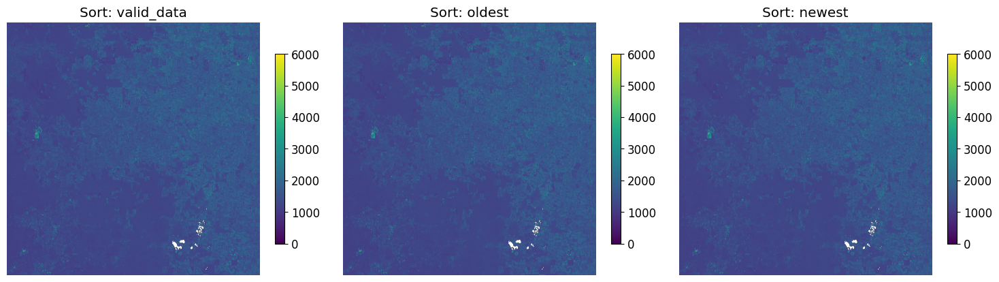

In [7]:
print("Comparing different sort methods...")

sort_methods = ["valid_data", "oldest", "newest"]
sort_arrays = []
sort_titles = []

for sort_method in sort_methods:
    print(f"Creating mosaic with sort method: {sort_method}")

    array, profile = mosaic(
        "50HMH",
        2023,
        start_month=6,
        start_day=1,
        duration_months=1,
        debug_cache=True,
        required_bands=["B04"],  # Just Red band for comparison
        sort_method=sort_method,
        mosaic_method="mean",
        no_data_threshold=None,
    )

    sort_arrays.append(array)
    sort_titles.append(f"Sort: {sort_method}")

# Compare the different sort methods
compare_mosaics(sort_arrays, sort_titles, band_index=0)

Comparing different mosaic methods...
Creating mosaic with method: mean


Scenes: 0/2 | Mosaic currently contains 100.00% no data pixels

Creating mosaic with method: first


Scenes: 0/2 | Mosaic currently contains 100.00% no data pixels

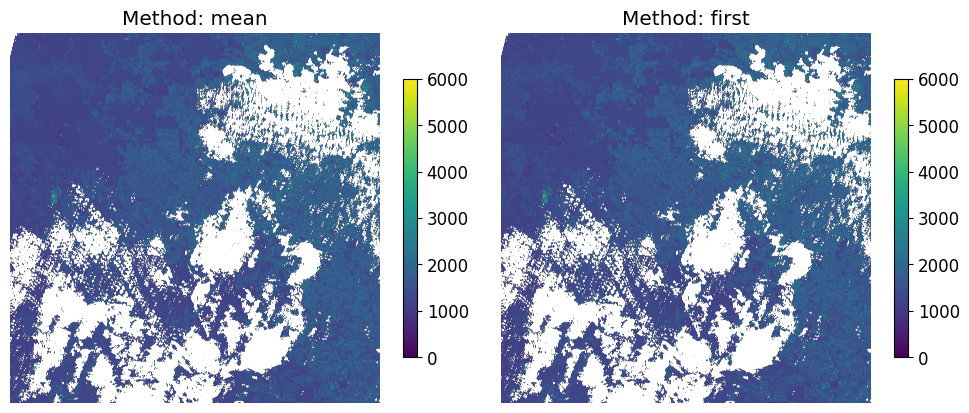

In [8]:
print("Comparing different mosaic methods...")

mosaic_methods = ["mean", "first"]
mosaic_arrays = []
mosaic_titles = []

for mosaic_method in mosaic_methods:
    print(f"Creating mosaic with method: {mosaic_method}")

    array, profile = mosaic(
        "50HMH",
        2023,
        start_month=6,
        start_day=1,
        duration_days=8,
        debug_cache=True,
        required_bands=["B04"],  # Red band
        sort_method="valid_data",
        mosaic_method=mosaic_method,
    )

    mosaic_arrays.append(array)
    mosaic_titles.append(f"Method: {mosaic_method}")

# Compare the different mosaic methods
compare_mosaics(mosaic_arrays, mosaic_titles, band_index=0)

Testing percentile mosaics...
Creating 25th percentile mosaic...


Scenes: 0/23 | Mosaic currently contains 100.00% no data pixels

Creating 50th percentile mosaic...


Scenes: 0/23 | Mosaic currently contains 100.00% no data pixels

Creating 75th percentile mosaic...


Scenes: 0/23 | Mosaic currently contains 100.00% no data pixels

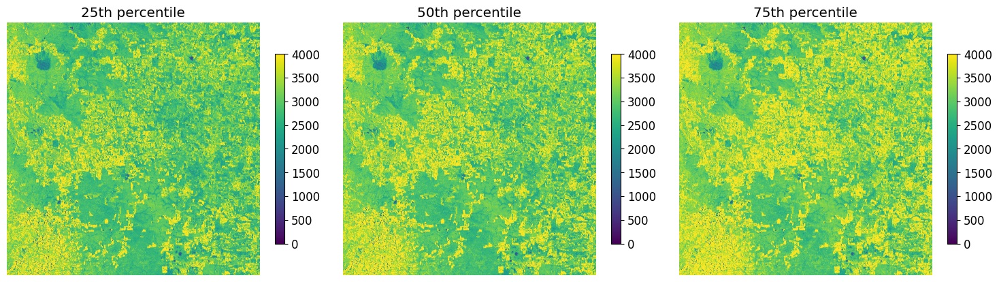

In [9]:
print("Testing percentile mosaics...")

percentiles = [25, 50, 75]
percentile_arrays = []
percentile_titles = []

for percentile in percentiles:
    print(f"Creating {percentile}th percentile mosaic...")

    array, profile = mosaic(
        "50HMH",
        2023,
        start_month=6,
        start_day=1,
        duration_months=2,  # Longer period for percentile comparison
        debug_cache=True,
        required_bands=["B8A"],  # NIR at 20m faster
        sort_method="valid_data",
        mosaic_method="percentile",
        percentile_value=percentile,
        no_data_threshold=None,  # do all the scenes
    )

    percentile_arrays.append(array)
    percentile_titles.append(f"{percentile}th percentile")

# Compare percentile mosaics
compare_mosaics(percentile_arrays, percentile_titles, band_index=0, vmin=0, vmax=4000)

Creating multi-band mosaic for analysis...


Scenes: 0/11 | Mosaic currently contains 100.00% no data pixels

Multi-band Array shape: (4, 10980, 10980)


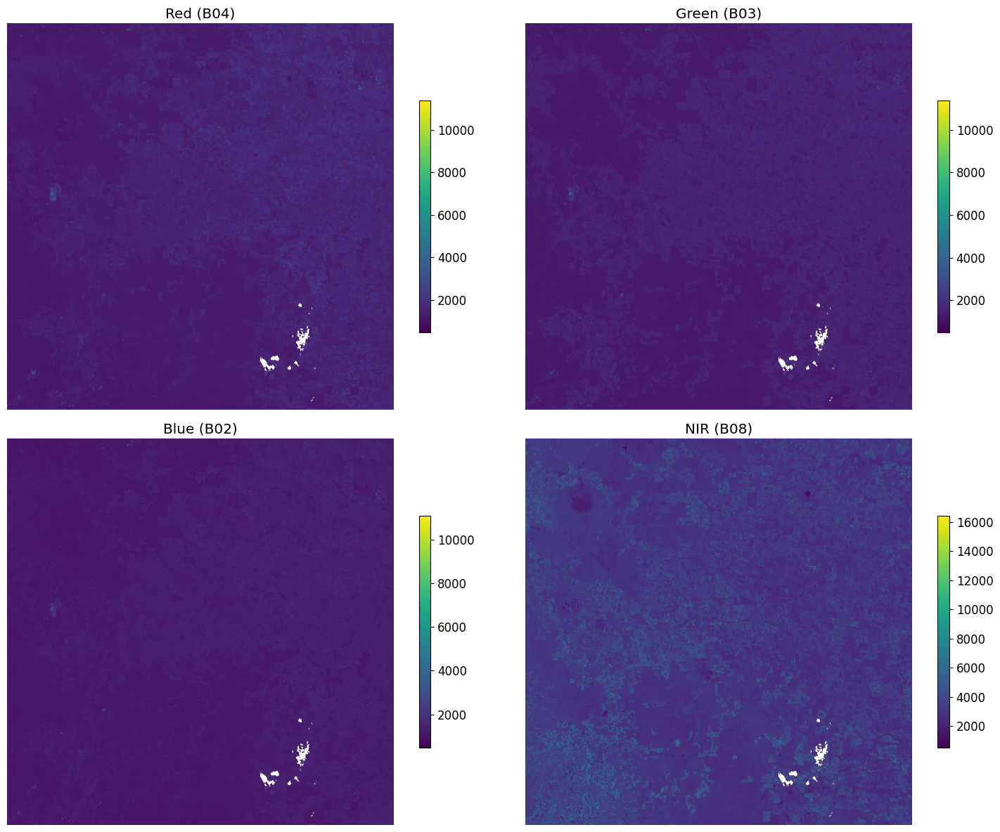

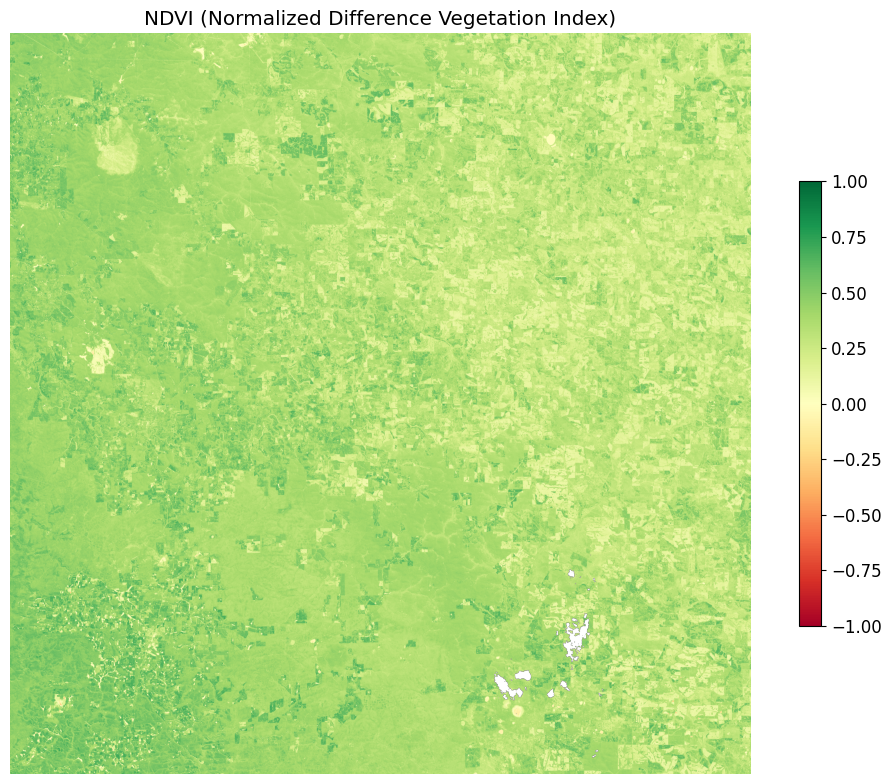

NDVI range: -0.413 to 0.834


In [10]:
print("Creating multi-band mosaic for analysis...")

# Create a mosaic with multiple bands for analysis
multi_array, multi_profile = mosaic(
    "50HMH",
    2023,
    start_month=6,
    start_day=1,
    duration_months=1,
    debug_cache=True,
    required_bands=["B04", "B03", "B02", "B08"],  # Red, Green, Blue, NIR
    sort_method="valid_data",
    mosaic_method="mean",
)

print(f"Multi-band Array shape: {multi_array.shape}")
band_names = ["Red (B04)", "Green (B03)", "Blue (B02)", "NIR (B08)"]

# Plot each band separately
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
axes = axes.flatten()

for i, band_name in enumerate(band_names):
    band_data = multi_array[i]
    masked_data = np.ma.masked_where(band_data == 0, band_data)

    im = axes[i].imshow(masked_data, cmap="viridis")
    axes[i].set_title(band_name)
    axes[i].axis("off")
    plt.colorbar(im, ax=axes[i], shrink=0.6)

plt.tight_layout()
plt.show()

# Calculate and plot NDVI
red = multi_array[0].astype(float)
nir = multi_array[3].astype(float)

# Calculate NDVI
ndvi = np.divide(nir - red, nir + red, out=np.zeros_like(nir), where=(nir + red) != 0)

plt.figure(figsize=(10, 8))
ndvi_masked = np.ma.masked_where((red == 0) | (nir == 0), ndvi)
im = plt.imshow(ndvi_masked, cmap="RdYlGn", vmin=-1, vmax=1)
plt.colorbar(im, shrink=0.6)
plt.title("NDVI (Normalized Difference Vegetation Index)")
plt.axis("off")
plt.tight_layout()
plt.show()

print(f"NDVI range: {ndvi_masked.min():.3f} to {ndvi_masked.max():.3f}")

In [11]:
print("Saving mosaics to files...")

# Save RGB mosaic
rgb_path = mosaic(
    "50HMH",
    2023,
    start_month=6,
    start_day=1,
    duration_days=7,
    output_dir=output_dir,
    debug_cache=True,
    required_bands=["B04", "B03", "B02"],
    sort_method="valid_data",
    mosaic_method="mean",
)

print(f"RGB mosaic saved to: {rgb_path}")

# Save visual mosaic
visual_path = mosaic(
    "50HMH",
    2023,
    start_month=6,
    start_day=1,
    duration_days=7,
    output_dir=output_dir,
    debug_cache=True,
    required_bands=["visual"],
    sort_method="valid_data",
    mosaic_method="mean",
)

print(f"Visual mosaic saved to: {visual_path}")

# Verify files exist and show their properties
for path in [rgb_path, visual_path]:
    if path.exists():
        with rio.open(path) as src:
            print(f"\nFile: {path.name}")
            print(f"  Shape: {src.shape}")
            print(f"  Bands: {src.count}")
            print(f"  CRS: {src.crs}")
            print(f"  Data type: {src.dtypes[0]}")
            print(f"  File size: {path.stat().st_size / (1024 * 1024):.1f} MB")

Saving mosaics to files...


Scenes: 0/2 | Mosaic currently contains 100.00% no data pixels

RGB mosaic saved to: visual_test_outputs/50HMH_2023-06-01_to_2023-06-08_valid_data_mean_B04_B03_B02.tif


Scenes: 0/2 | Mosaic currently contains 100.00% no data pixels

Visual mosaic saved to: visual_test_outputs/50HMH_2023-06-01_to_2023-06-08_valid_data_mean_visual.tif

File: 50HMH_2023-06-01_to_2023-06-08_valid_data_mean_B04_B03_B02.tif
  Shape: (10980, 10980)
  Bands: 3
  CRS: EPSG:32750
  Data type: int16
  File size: 391.2 MB

File: 50HMH_2023-06-01_to_2023-06-08_valid_data_mean_visual.tif
  Shape: (10980, 10980)
  Bands: 3
  CRS: EPSG:32750
  Data type: uint8
  File size: 227.4 MB


Testing different time periods...
Creating mosaic for 3 days...


Scenes: 0/1 | Mosaic currently contains 100.00% no data pixels

  Data coverage: 55.6%
Creating mosaic for 1 week...


Scenes: 0/2 | Mosaic currently contains 100.00% no data pixels

  Data coverage: 70.1%
Creating mosaic for 2 weeks...


Scenes: 0/4 | Mosaic currently contains 100.00% no data pixels

  Data coverage: 96.2%


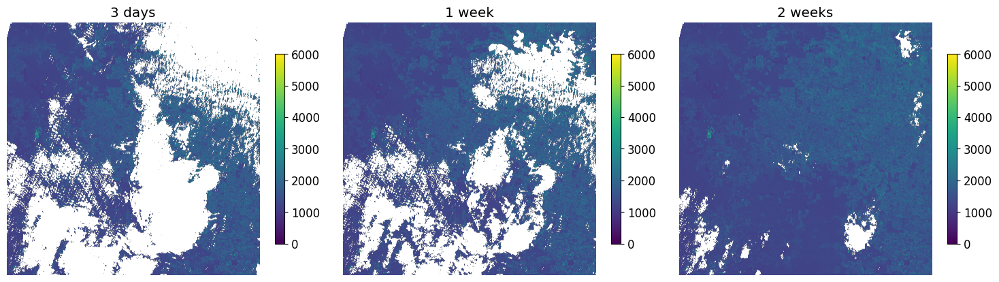

In [12]:
print("Testing different time periods...")

time_configs = [
    {"duration_days": 3, "label": "3 days"},
    {"duration_days": 7, "label": "1 week"},
    {"duration_days": 14, "label": "2 weeks"},
]

time_arrays = []
time_titles = []

for config in time_configs:
    print(f"Creating mosaic for {config['label']}...")

    array, profile = mosaic(
        "50HMH",
        2023,
        start_month=6,
        start_day=1,
        duration_days=config["duration_days"],
        debug_cache=True,
        required_bands=["B04"],  # Red band
        sort_method="valid_data",
        mosaic_method="mean",
    )

    time_arrays.append(array)
    time_titles.append(config["label"])

    # Calculate data coverage
    valid_pixels = np.sum(array[0] > 0)
    total_pixels = array[0].size
    coverage = (valid_pixels / total_pixels) * 100
    print(f"  Data coverage: {coverage:.1f}%")

# Compare different time periods
compare_mosaics(time_arrays, time_titles, band_index=0)


Creating visual band mosaic over an area with incomplete coverage...


Scenes: 0/12 | Mosaic currently contains 100.00% no data pixels

Visual Array shape: (3, 10980, 10980)
Visual Array dtype: uint8
Visual Array range: 0 to 255


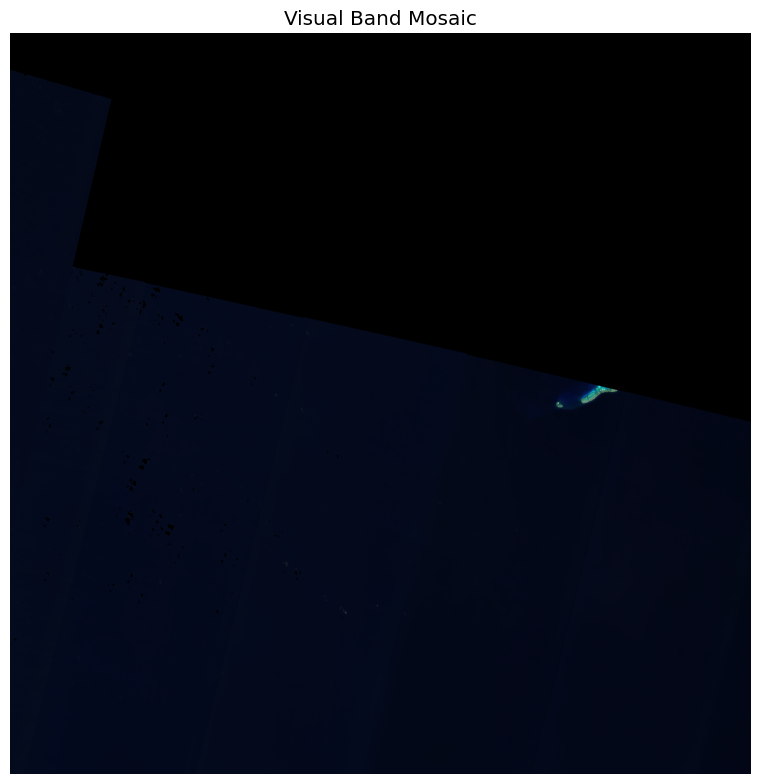

In [13]:
print("Creating visual band mosaic over an area with incomplete coverage...")

# Create a visual band mosaic (this should be RGB in uint8)
visual_array, visual_profile = mosaic(
    "56KQB",
    2023,
    start_month=6,
    start_day=4,
    duration_months=1,
    debug_cache=True,
    required_bands=["visual"],
    sort_method="valid_data",
    mosaic_method="mean",
)

print(f"Visual Array shape: {visual_array.shape}")
print(f"Visual Array dtype: {visual_array.dtype}")
print(f"Visual Array range: {visual_array.min()} to {visual_array.max()}")

# Plot the visual mosaic
plot_mosaic_rgb(visual_array, "Visual Band Mosaic", percentile_stretch=False)